# Machine Learning: Assignment 5 
## SVM plus Other Classification Method (max. 10p)

The dataset for the assignment is "Date Fruit Datasets" file you can find from [Date_Fruit_Datasets.xlsx](data/Date_Fruit_Datasets.xlsx), which contains 898 rows and 34 columns of data about dates and a column telling the species of dates.

There are **seven** (**7**) date fruit species in the dataset, so this is **multi-class classification problem**.

More information about the data and related research: [https://www.muratkoklu.com/datasets/](https://www.muratkoklu.com/datasets/).


In [1]:
# Write Your information in here
student_name = 'Jaka Cosic Hämäläinen'
student_email = "AA6111@student.jamk.fi"

## Assignment 5.1
### Topic: Data Preprocessing (2 points)
The dataset has a class variable (*target*) in the last column.

Let's do the following preprocessing steps with the dataset:

1. Load the data into the `DataFrame`.
2. Name the columns of the `DataFrame` according to the dataset.
3. Preprocess the dataset
   * Optimize the data input to the machine learning model
   * You can remove "unnecessary features" at your discretion
   * Handling of abnormal (outliers) or empty data values
   * Remember that all categories should be numeric
4. Scale column values by normalizing them.

In [2]:
# TODO: Write your code in this cell

import pandas as pd
import numpy as np
from sklearn.preprocessing import LabelEncoder
from sklearn.preprocessing import MinMaxScaler
from scipy import stats
import warnings

warnings.simplefilter(action='ignore', category=FutureWarning)

file_path = "data/Date_Fruit_Datasets.xlsx"
df = pd.read_excel(file_path)

df.drop(columns=[
    "SHAPEFACTOR_1", 
    "SHAPEFACTOR_2", 
    "SHAPEFACTOR_3", 
    "SHAPEFACTOR_4", 
    "SOLIDITY", 
    "CONVEX_AREA", 
    "EXTENT", 
    "MeanRG", 
    "MeanRB", 
    "EntropyRG", 
    "EntropyRB", 
    "StdDevRG", 
    "StdDevRB",
    "SkewRG",
    "SkewRB",
    "KurtosisRG",
    "KurtosisRB",
    "ALLdaub4RG",
    "ALLdaub4RB"
    ], 
    inplace=True)

z_scores = np.abs(stats.zscore(df.select_dtypes(include=[np.number])))
df = df[(z_scores < 3).all(axis=1)]

df.dropna(inplace=True)  

label_encoder = LabelEncoder()
df["Class"] = label_encoder.fit_transform(df["Class"])

scaler = MinMaxScaler()
df.iloc[:, :-1] = scaler.fit_transform(df.iloc[:, :-1])

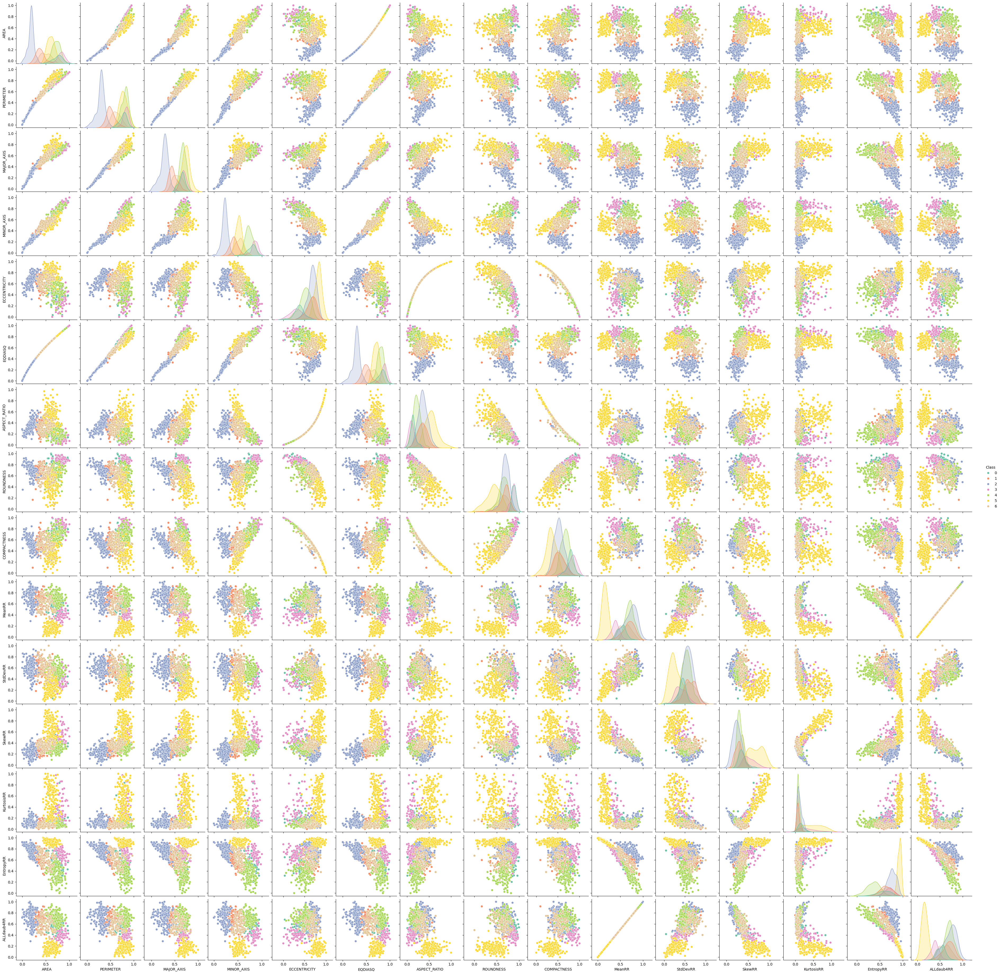

In [3]:
# TODO: Plotting features 

import seaborn as sns
import matplotlib.pyplot as plt

sns.pairplot(df, hue='Class', palette='Set2')
plt.show()

In [4]:
# Answers to the assignment. Note! Do not edit this cell, just run it after you complete the assignment.
# The DataFrame should be in the df variable.
print(f'Columns: {df.columns}')
print(f'First row by position: {df.iloc[0]}')

Columns: Index(['AREA', 'PERIMETER', 'MAJOR_AXIS', 'MINOR_AXIS', 'ECCENTRICITY',
       'EQDIASQ', 'ASPECT_RATIO', 'ROUNDNESS', 'COMPACTNESS', 'MeanRR',
       'StdDevRR', 'SkewRR', 'KurtosisRR', 'EntropyRR', 'ALLdaub4RR', 'Class'],
      dtype='object')
First row by position: AREA            0.796392
PERIMETER       0.812082
MAJOR_AXIS      0.682803
MINOR_AXIS      0.822311
ECCENTRICITY    0.381362
EQDIASQ         0.856663
ASPECT_RATIO    0.135677
ROUNDNESS       0.879018
COMPACTNESS     0.791507
MeanRR          0.672973
StdDevRR        0.404474
SkewRR          0.257969
KurtosisRR      0.137085
EntropyRR       0.370398
ALLdaub4RR      0.672959
Class           0.000000
Name: 0, dtype: float64


## Assignment 5.2: Training and Testing Data (2 points)

Split the data into training and testing data using the [train_test_split](https://scikit-learn.org/stable/modules/generated/sklearn.model_selection.train_test_split.html) function of the `scikit-learn` library.
Put *75%* of the data in training data.

1. Save the training data and its class variable to the variables `X_train`, `y_train`,
2. Save the test data to the variables `X_test`, `y_test`.

If you think there are unnecessary variables in the data, you should remove them at this stage.

Use the number `1550` as the random seed and the size of the test data *25%*.

In [5]:
# TODO: Write your implementation in this cell.

# TODO: Choose the appropriate scaling method
# TODO: Normalize the data

from sklearn.model_selection import train_test_split

# Define features (X) and target (y)
X = df.drop(columns=["Class"])  # All columns except 'Class'
y = df["Class"]  # The target variable

# Split data into training (75%) and testing (25%) sets
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.25, random_state=1550, stratify=y)

In [6]:
# Answers to the assignment. Note! Do not edit this cell, just run it after you complete the assignment.

df_X_train = pd.DataFrame(X_train, columns=X.columns)
#
print(len(df))
print(len(X_train))
print(len(X_test))
#
df_X_train.head()

857
642
215


,AREA,PERIMETER,MAJOR_AXIS,MINOR_AXIS,ECCENTRICITY,EQDIASQ,ASPECT_RATIO,ROUNDNESS,COMPACTNESS,MeanRR,StdDevRR,SkewRR,KurtosisRR,EntropyRR,ALLdaub4RR
355,0.170292,0.262762,0.237667,0.227131,0.621427,0.266164,0.294815,0.761371,0.594849,0.835574,0.664197,0.279264,0.066973,0.714743,0.835520
37,0.806611,0.818174,0.680947,0.842420,0.342552,0.864212,0.117141,0.883869,0.813435,0.559866,0.488521,0.336400,0.118380,0.513322,0.559806
89,0.292336,0.446316,0.435412,0.404158,0.645596,0.411174,0.316690,0.527289,0.374869,0.851648,0.739065,0.231974,0.090995,0.570386,0.851653
478,0.703004,0.776934,0.667336,0.709850,0.531954,0.785661,0.224764,0.735294,0.674208,0.629145,0.569830,0.386720,0.040162,0.476860,0.629110
481,0.756082,0.849775,0.759115,0.703608,0.656519,0.826475,0.327127,0.606428,0.538113,0.654861,0.574832,0.336177,0.042117,0.405964,0.654804


## Assignment 5.3: Implement Support Vector Machine Classification (2 points)

1. Use the `scikit-learn` library's *Linear Support Vector Classification* function to train a classifier with your training data that classifies each date fruit species.

2. Create predictions for the data points of your test data in the `y_pred` variable.

3. Use the `metrics` module to make a [classification report](https://scikit-learn.org/stable/modules/generated/sklearn.metrics.classification_report.html) for the predictions of your test data. Save results to the `cr` variable.

4. Use the `metrics` module to make a **confusion matrix** and store it in the `cm` variable.

In [7]:
# TODO: Write your implementation in this cell.
# TODO: use LinearSVC.
cr = cm = None

from sklearn.svm import LinearSVC
from sklearn import metrics

svm_classifier = LinearSVC(random_state=42)
svm_classifier.fit(X_train, y_train)

y_pred = svm_classifier.predict(X_test)

cr = metrics.classification_report(y_test, y_pred)

cm = metrics.confusion_matrix(y_test, y_pred)

In [8]:
# Answers to the assignment. Note! Do not edit this cell, just run it after you complete the assignment.
# The results are in cm and cr variables.
print(f'Classification report:\n {cr}')
print(f'Confusion matrix:\n {cm}')

Classification report:
               precision    recall  f1-score   support

           0       0.50      0.40      0.44        15
           1       0.73      0.44      0.55        25
           2       0.86      1.00      0.93        51
           3       0.65      0.69      0.67        16
           4       0.76      0.95      0.84        40
           5       0.98      1.00      0.99        45
           6       0.62      0.43      0.51        23

    accuracy                           0.80       215
   macro avg       0.73      0.70      0.70       215
weighted avg       0.79      0.80      0.78       215

Confusion matrix:
 [[ 6  0  0  6  3  0  0]
 [ 0 11  8  0  3  0  3]
 [ 0  0 51  0  0  0  0]
 [ 3  0  0 11  1  0  1]
 [ 0  0  0  0 38  0  2]
 [ 0  0  0  0  0 45  0]
 [ 3  4  0  0  5  1 10]]


## Assignment 5.4: Comparison with another ML method  (2 points)

For comparison, try to develop the model using another classification method:
* The method can be **RandomForest** (or if you want **DecisionTree** etc., but still justify your choice).

So you can freely select the ML classification method used in this comparison.

In [9]:
# TODO: Write your implementation in this cell.

# TODO: Implementation of another Machine Learning Classification method.
# TODO: The method can be RandomForest or any other method that works with this data "well enough".

from sklearn.ensemble import RandomForestClassifier

rf_model = RandomForestClassifier(random_state=42) 
rf_model.fit(X_train, y_train)

y_pred_rf = rf_model.predict(X_test)

cr_rf = metrics.classification_report(y_test, y_pred_rf)

cm_rf = metrics.confusion_matrix(y_test, y_pred_rf)

print(f'Random Forest Classification report:\n{cr_rf}')
print(f'Random Forest Confusion matrix:\n{cm_rf}')


Random Forest Classification report:
              precision    recall  f1-score   support

           0       0.71      0.67      0.69        15
           1       0.55      0.48      0.51        25
           2       0.89      0.94      0.91        51
           3       0.72      0.81      0.76        16
           4       0.97      0.93      0.95        40
           5       1.00      0.98      0.99        45
           6       0.52      0.57      0.54        23

    accuracy                           0.82       215
   macro avg       0.77      0.77      0.77       215
weighted avg       0.82      0.82      0.82       215

Random Forest Confusion matrix:
[[10  0  0  4  0  0  1]
 [ 0 12  6  0  0  0  7]
 [ 0  3 48  0  0  0  0]
 [ 3  0  0 13  0  0  0]
 [ 0  0  0  0 37  0  3]
 [ 0  0  0  0  0 44  1]
 [ 1  7  0  1  1  0 13]]


## Assignment 5.5: Analysis of the results (2 points)

Verbally interpret the obtained results from both ML methods.
* How well the support vector did in the classification
* How well the another ML method did in the classification

Let's do comparison of Different Classification Models used in this assignment.
* Compare the classification results of SVM and Selected Classification models.
* Compare the obtained results and interpret the results verbally.
* Compare the **accuracy** and **confusion matrix** of the classification results for both methods.

In [10]:
# TODO: Compare the accuracy of the classification results of both classification methods.
# TODO: Compare the confusion matrix of both classification methods with each other.

print(f'Classification report for SVM:\n{cr}')

print(f'Classification report for Random Forest:\n{cr_rf}')

print(f'Confusion matrix for SVM:\n{cm}')

print(f'Confusion matrix for Random Forest:\n{cm_rf}')

svm_accuracy = metrics.accuracy_score(y_test, y_pred)
rf_accuracy = metrics.accuracy_score(y_test, y_pred_rf)

print(f'SVM Accuracy: {svm_accuracy:.4f}')
print(f'Random Forest Accuracy: {rf_accuracy:.4f}')


Classification report for SVM:
              precision    recall  f1-score   support

           0       0.50      0.40      0.44        15
           1       0.73      0.44      0.55        25
           2       0.86      1.00      0.93        51
           3       0.65      0.69      0.67        16
           4       0.76      0.95      0.84        40
           5       0.98      1.00      0.99        45
           6       0.62      0.43      0.51        23

    accuracy                           0.80       215
   macro avg       0.73      0.70      0.70       215
weighted avg       0.79      0.80      0.78       215

Classification report for Random Forest:
              precision    recall  f1-score   support

           0       0.71      0.67      0.69        15
           1       0.55      0.48      0.51        25
           2       0.89      0.94      0.91        51
           3       0.72      0.81      0.76        16
           4       0.97      0.93      0.95        40
      

<font color="red">PLEASE WRITE YOUR EXPLANATION HERE.</font>

How well the support vector did in the classification?
The accuracy for SVM is 0.80 which means that 80% of the test data was classified correctly. The classification report gives varied scores depending on the class. Most precise predictions were for class 5 or SAFAVI date.

How well the another ML method did in the classification?
Random Forest has a slightly higher accuracy of 0.8233 or 82.33% of the test data was classified correctly. The model also most accurately predicted class SAFAVI. Overall classification report values for Random Forest are slightly better thatn SVM. F1-score shows the average of precision and recall and from the output we can see that Random Forest has slightly better results. This indicates better performance. 
Both models show some misclassifications in the confusion matrix, but Random Forest still had fewer overall.


Q: Are there other good classification methods to apply with this dataset or any other way to improve the classification results?
Perhaps K-Nearest Neighbours and Logistic Regression can be applied. 
